In [1]:
import os
import torch
from PIL import Image
from tqdm import tqdm
from sentence_transformers import SentenceTransformer, util

img_model = SentenceTransformer('clip-ViT-B-32')
text_model = SentenceTransformer('sentence-transformers/clip-ViT-B-32-multilingual-v1')

image_folder_path = r'C:\Users\pooja\OneDrive\Documents\university\sem-2\AI\images'

image_paths = [os.path.join(image_folder_path, filename) for filename in os.listdir(image_folder_path)
               if filename.endswith(('.jpg', '.jpeg', '.png'))]

images = [Image.open(img_path) for img_path in image_paths]
img_embeddings = img_model.encode(images)

caption_file_path = r'C:\Users\pooja\OneDrive\Desktop\captions.txt'

with open(caption_file_path, 'r', encoding='utf-8') as file:
    lines = file.readlines()

image_captions = {}
for line in lines[1:]:
    parts = line.strip().split(',')
    image_name, caption = parts[0], parts[1]
    if image_name not in image_captions:
        image_captions[image_name] = []
    image_captions[image_name].append(caption)

cosine_similarity_scores = []

for i, image_path in enumerate(tqdm(image_paths, desc="Calculating Cosine Similarity Scores")):
    captions = image_captions.get(os.path.basename(image_path), [])
    if not captions:
        continue

    image_embedding = torch.tensor([img_embeddings[i]])

    similarity_scores = []
    with torch.no_grad():
        for caption in captions:
            text_embedding = text_model.encode([caption])[0]
            cosine_similarity = util.cos_sim(text_embedding, image_embedding)
            similarity_scores.append(cosine_similarity.item())

    cosine_similarity_scores.append(similarity_scores)

print("Cosine Similarity Scores:", cosine_similarity_scores)


Calculating Cosine Similarity Scores:   0%|          | 0/6 [00:00<?, ?it/s]C:\Users\pooja\AppData\Local\Temp\ipykernel_32292\2668405713.py:48: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\cb\pytorch_1000000000000\work\torch\csrc\utils\tensor_new.cpp:264.)
  image_embedding = torch.tensor([img_embeddings[i]])
Calculating Cosine Similarity Scores: 100%|██████████| 6/6 [00:02<00:00,  2.92it/s]

Cosine Similarity Scores: [[0.3070399761199951, 0.266357958316803, 0.2922212481498718, 0.33849823474884033, 0.34363552927970886], [0.31690293550491333, 0.3229268193244934, 0.29286274313926697, 0.3351271152496338, 0.3415718078613281], [0.3155525326728821, 0.29615578055381775, 0.31102079153060913, 0.30342572927474976, 0.30390626192092896], [0.29535752534866333, 0.2343033254146576, 0.24356916546821594, 0.31346750259399414, 0.27973371744155884], [0.2827552855014801, 0.2557465732097626, 0.2913316786289215, 0.2920888066291809, 0.2494741529226303], [0.3470095992088318, 0.34933626651763916, 0.37898123264312744, 0.39041605591773987, 0.36614111065864563]]


In [2]:
import os
from sentence_transformers import SentenceTransformer, util
from transformers import pipeline

img_model = SentenceTransformer('clip-ViT-B-32')
text_model = SentenceTransformer('sentence-transformers/clip-ViT-B-32-multilingual-v1')

image_folder_path = r'C:\Users\pooja\OneDrive\Documents\university\sem-2\AI\images'

image_paths = [os.path.join(image_folder_path, filename) for filename in os.listdir(image_folder_path)
               if filename.endswith(('.jpg', '.jpeg', '.png'))]

images = [Image.open(img_path) for img_path in image_paths]
img_embeddings = img_model.encode(images)

caption_file_path = r'C:\Users\pooja\OneDrive\Desktop\captions.txt'

with open(caption_file_path, 'r', encoding='utf-8') as file:
    lines = file.readlines()

image_captions = {}
for line in lines[1:]:
    parts = line.strip().split(',')
    image_name, caption = parts[0], parts[1]
    if image_name not in image_captions:
        image_captions[image_name] = []
    image_captions[image_name].append(caption)

zero_shot_classifier = pipeline("zero-shot-classification", model="facebook/bart-large-mnli")

for i, image_path in enumerate(image_paths):
    captions = image_captions.get(os.path.basename(image_path), [])
    if not captions:
        continue

    for caption in captions:
        result = zero_shot_classifier(caption, captions)

        predicted_label = result["labels"][0]
        confidence_score = result["scores"][0]

        print(f"Image: {os.path.basename(image_path)}, Caption: {caption}, Predicted Label: {predicted_label}, Confidence: {confidence_score}")


model.safetensors:   0%|          | 0.00/1.63G [00:00<?, ?B/s]

C:\Users\pooja\anaconda3\lib\site-packages\huggingface_hub\file_download.py:147: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\pooja\.cache\huggingface\hub. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to see activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

Image: 12830823_87d2654e31.jpg, Caption: Children sit and watch the fish moving in the pond, Predicted Label: Children sit and watch the fish moving in the pond, Confidence: 0.5045876502990723
Image: 12830823_87d2654e31.jpg, Caption: people stare at the orange fish ., Predicted Label: people stare at the orange fish ., Confidence: 0.9287858009338379
Image: 12830823_87d2654e31.jpg, Caption: Several people are standing near a fish pond ., Predicted Label: Several people are standing near a fish pond ., Confidence: 0.9570915102958679
Image: 12830823_87d2654e31.jpg, Caption: Some children watching fish in a pool ., Predicted Label: Some children watching fish in a pool ., Confidence: 0.6124799847602844
Image: 12830823_87d2654e31.jpg, Caption: There are several people and children looking into water with a blue tiled floor and goldfish ., Predicted Label: There are several people and children looking into water with a blue tiled floor and goldfish ., Confidence: 0.4374880790710449
Image: 17

In [20]:
pip install h5py

Note: you may need to restart the kernel to use updated packages.


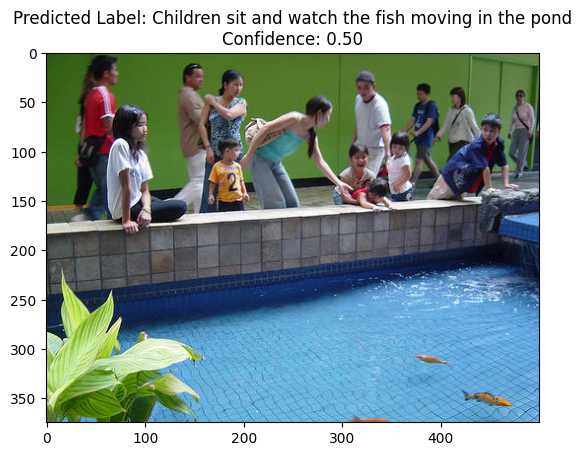

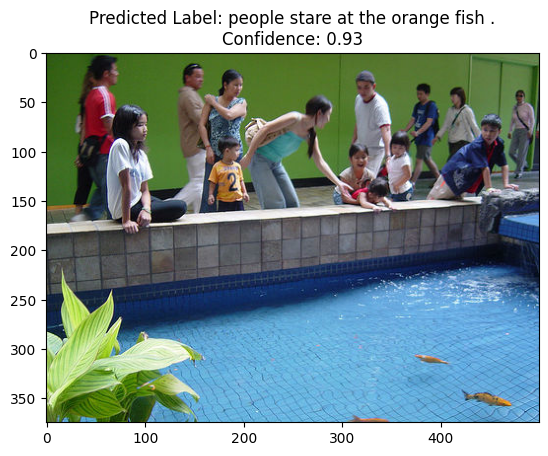

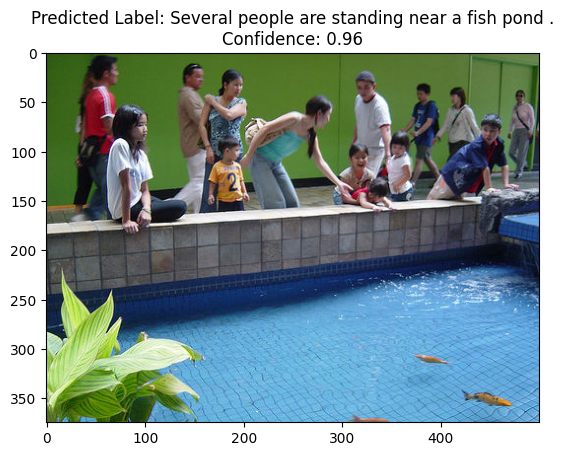

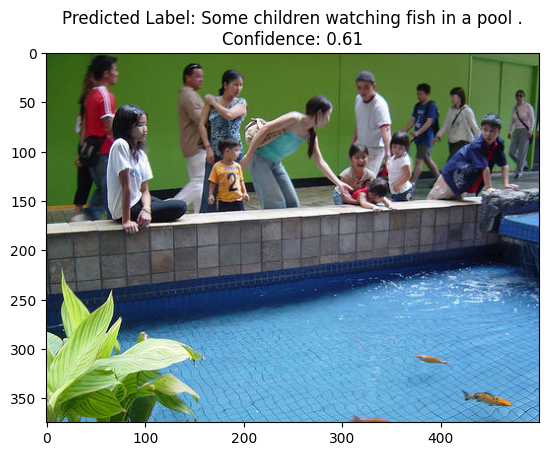

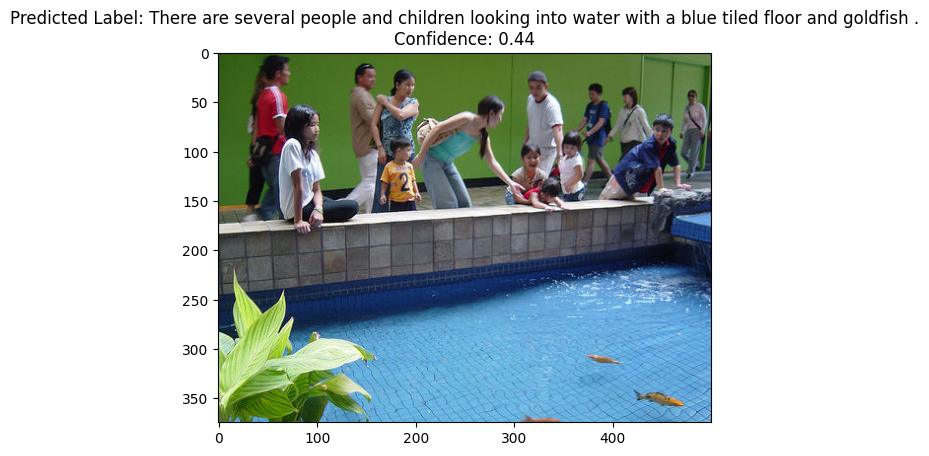

...

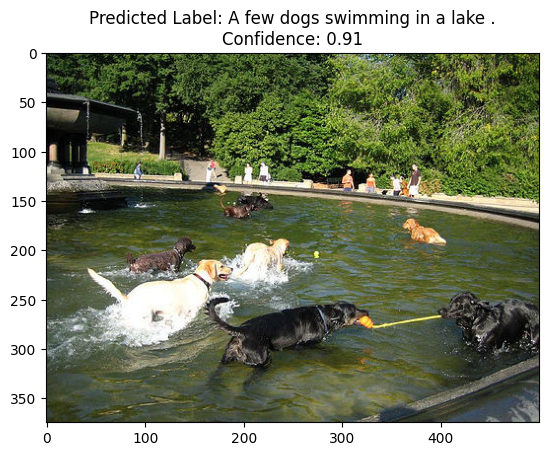

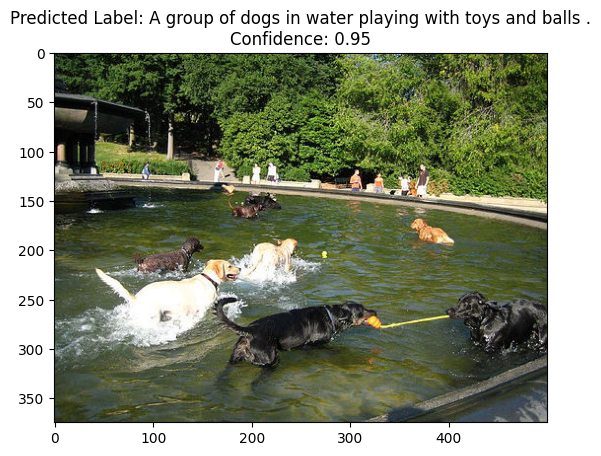

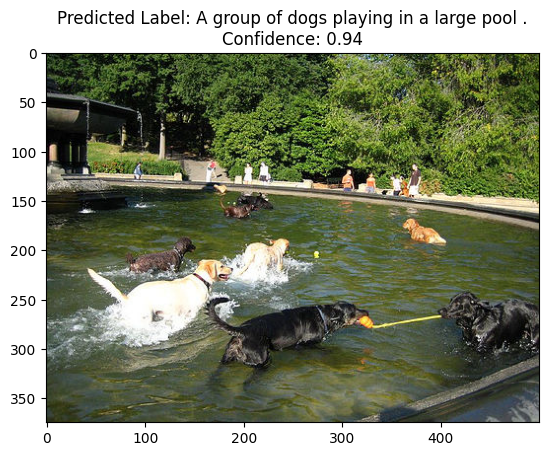

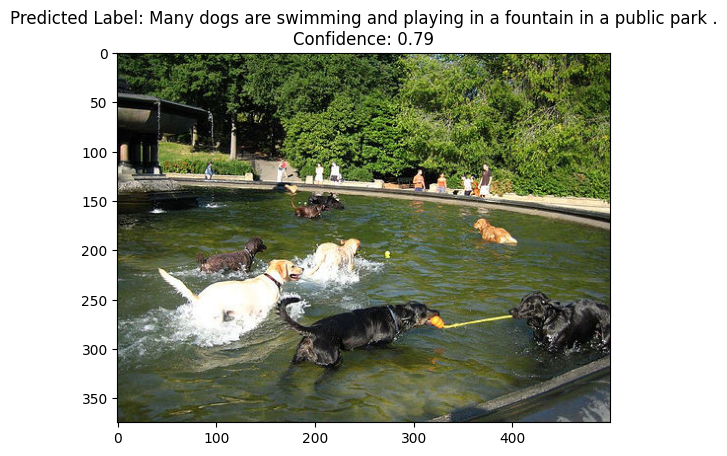

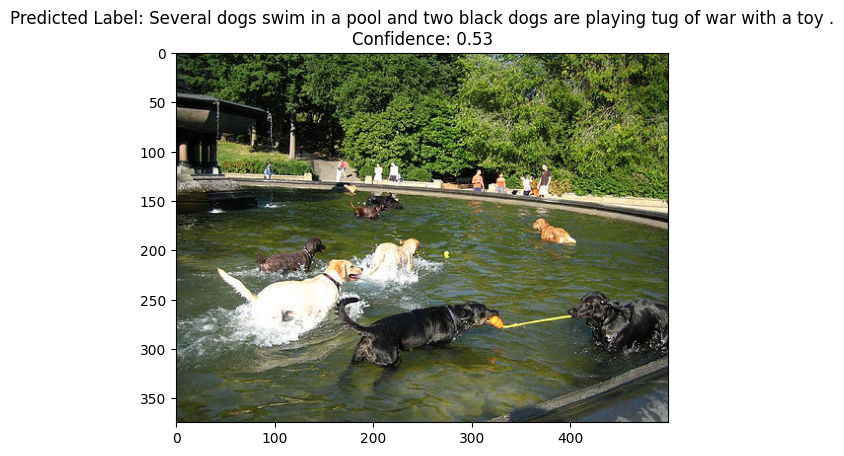

In [3]:
import os
from sentence_transformers import SentenceTransformer, util
from transformers import pipeline
from PIL import Image
import matplotlib.pyplot as plt

img_model = SentenceTransformer('clip-ViT-B-32')
text_model = SentenceTransformer('sentence-transformers/clip-ViT-B-32-multilingual-v1')

image_folder_path = r'C:\Users\pooja\OneDrive\Documents\university\sem-2\AI\images'

image_paths = [os.path.join(image_folder_path, filename) for filename in os.listdir(image_folder_path)
               if filename.endswith(('.jpg', '.jpeg', '.png'))]

images = [Image.open(img_path) for img_path in image_paths]
img_embeddings = img_model.encode(images)

caption_file_path = r'C:\Users\pooja\OneDrive\Desktop\captions.txt'

with open(caption_file_path, 'r', encoding='utf-8') as file:
    lines = file.readlines()

image_captions = {}
for line in lines[1:]:
    parts = line.strip().split(',')
    image_name, caption = parts[0], parts[1]
    if image_name not in image_captions:
        image_captions[image_name] = []
    image_captions[image_name].append(caption)

zero_shot_classifier = pipeline("zero-shot-classification", model="facebook/bart-large-mnli")

for i, image_path in enumerate(image_paths):
    captions = image_captions.get(os.path.basename(image_path), [])
    if not captions:
        continue

    for caption in captions:
        result = zero_shot_classifier(caption, captions)

        predicted_label = result["labels"][0]
        confidence_score = result["scores"][0]

        plt.imshow(images[i])
        plt.title(f"Predicted Label: {predicted_label}\nConfidence: {confidence_score:.2f}")
        plt.show()
